# Notes



## Robinhood Data
### Database

- each timestamp reflects the amount of users currently holding that particular stock

### Monthly Users

**Source:** https://www.statista.com/statistics/822176/number-of-users-robinhood/

- Comparing figures on Statista with data on Robinhood's website it emerges that the number of active users refers to Dec 31  
- Smoothing to avoid sudden jumps


## CRSP Data - Retrieved via WRDS
### Share Code (SHRCD)

**SHRCD** is a two-digit code describing the type of shares traded. The first digit describes the type of security traded.

**First Digit - Security Type**

| Code | Definition |
|------|--------------------------------------|
| 1    | Ordinary Common Shares               |
| 2    | Certificates                         |
| 3    | ADRs (American Depository Receipts)  |
| 4    | SBIs (Shares of Beneficial Interest) |
| 7    | Units (Depository Units, Units of Beneficial Interest, Units of Limited Partnership Interest, Depository Receipts, etc.) |

 **Note:** "Units" (code 7) does not represent combinations of common stock and anything else, such as warrants.

**Second Digit - Security Type (Detailed Information)**

| Code | Definition |
|------|------------------------------------------------|
| 0    | Securities which have not been further defined. |
| 1    | Securities which need not be further defined.  |
| 2    | Companies incorporated outside the US.        |
| 3    | Americus Trust Components (Primes and Scores). |
| 4    | Closed-end funds.                             |
| 5    | Closed-end fund companies incorporated outside the US. |
| 8    | REITs (Real Estate Investment Trusts).        |


# Code

##  Robinhood Dataframe

In [2]:

from DataLoader import DataLoader
import warnings
warnings.simplefilter(action='ignore', category=Warning)

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import seaborn as sns


dl = DataLoader()

dl.df_rh

Loading Robinhood data
Loading CRSP data


,A,AA,AAAU,AACAY,AACG,AADR,AAGIY,AAL,AAMC,AAME,...,ZUO,ZURVY,ZVO,ZYME,ZYNE,ZYXI,_OUT,_PRN,sum,num_stocks
timestamp,,,,,,,,,,,,,,,,,,,,,
2018-05-02,590.000000,NaN,NaN,NaN,55.000000,NaN,NaN,3755.000000,NaN,119.000000,...,539.000000,NaN,NaN,NaN,6127.000000,NaN,158.000000,12.000000,5.597134e+06,5843
2018-05-03,586.473684,NaN,NaN,NaN,55.473684,NaN,NaN,3778.368421,NaN,118.315789,...,544.423077,NaN,NaN,NaN,6137.052632,NaN,156.263158,12.000000,5.611598e+06,5847
2018-05-04,587.458333,NaN,NaN,NaN,55.458333,NaN,NaN,3762.750000,NaN,119.000000,...,547.739130,NaN,NaN,NaN,6145.416667,NaN,154.000000,12.000000,5.610351e+06,5853
2018-05-05,588.000000,NaN,NaN,NaN,56.000000,NaN,NaN,3748.000000,NaN,119.000000,...,550.000000,NaN,NaN,NaN,6140.000000,NaN,154.000000,12.000000,5.574708e+06,5849
2018-05-06,588.000000,NaN,NaN,NaN,56.000000,NaN,NaN,3748.000000,NaN,119.000000,...,550.000000,NaN,NaN,NaN,6140.000000,NaN,154.000000,12.000000,5.574776e+06,5849
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-08-09,1616.000000,5678.000000,1727.000000,361.000000,1664.000000,13.0,334.000000,641785.000000,89.000000,260.000000,...,6202.000000,231.000000,5806.000000,674.000000,32097.000000,3192.000000,2021.000000,23.000000,4.198372e+07,8130
2020-08-10,1619.208333,5668.750000,1735.041667,360.125000,1658.791667,13.0,334.166667,640821.833333,88.375000,259.333333,...,6224.458333,230.333333,5759.166667,673.208333,32060.833333,3186.916667,2017.041667,23.416667,4.219150e+07,8132
2020-08-11,1625.500000,5683.166667,1732.833333,358.583333,1647.458333,13.0,334.625000,639770.583333,87.250000,255.958333,...,6308.166667,228.416667,5635.833333,674.875000,31939.875000,3170.041667,2002.500000,24.000000,4.214662e+07,8130


### Visualization

#### Distributuions

#### Number of Stocks

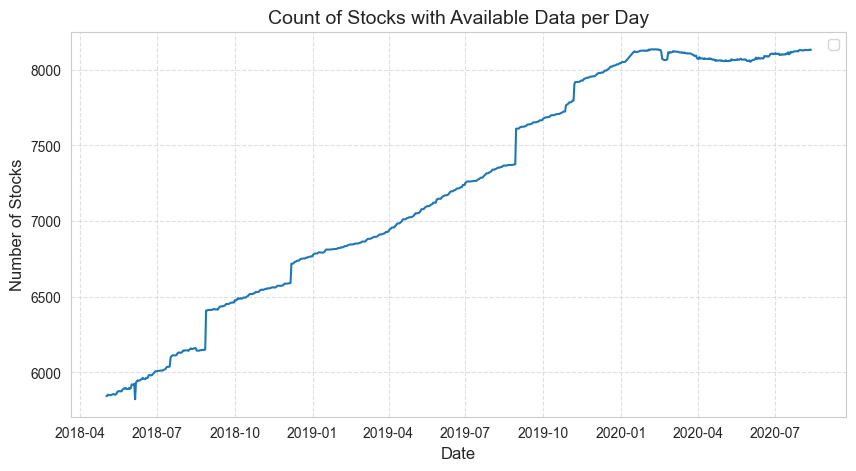

In [116]:
sns.set_style("whitegrid")

plt.figure(figsize=(10, 5))  # Set figure size
sns.lineplot(x=dl.df_rh.index, y='num_stocks', data=dl.df_rh)

# Formatting
plt.xlabel('Date', fontsize=12)
plt.ylabel('Number of Stocks', fontsize=12)
plt.title('Count of Stocks with Available Data per Day', fontsize=14)
plt.xticks(rotation=0)  # Rotate x-axis labels for better readability
plt.grid(True, linestyle='--', alpha=0.6)  # Add grid
plt.legend([], [], frameon=False) # Suppress legend
plt.legend()

# Show the plot
plt.show()

#### Number of Active Positions

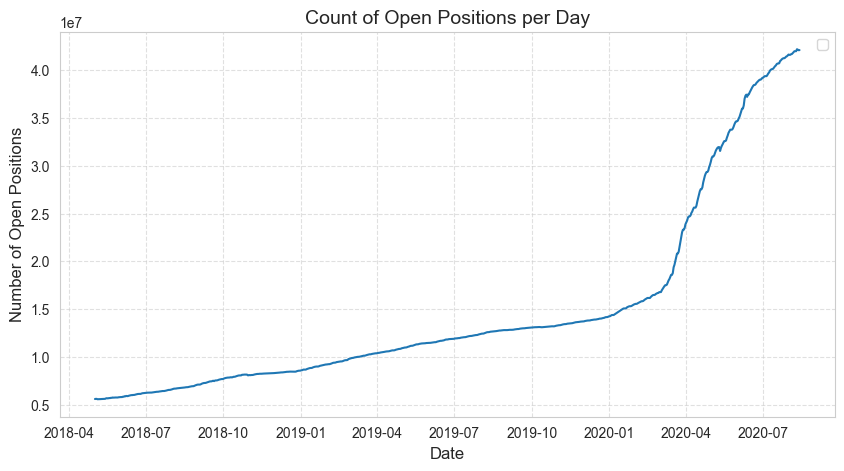

In [117]:
sns.set_style("whitegrid")

plt.figure(figsize=(10, 5))  # Set figure size
sns.lineplot(x=dl.df_rh.index, y='sum', data=dl.df_rh)

# Formatting
plt.xlabel('Date', fontsize=12)
plt.ylabel('Number of Open Positions', fontsize=12)
plt.title('Count of Open Positions per Day', fontsize=14)
plt.xticks(rotation=0)  # Rotate x-axis labels for better readability
plt.grid(True, linestyle='--', alpha=0.6)  # Add grid
plt.legend([], [], frameon=False) # Suppress legend
plt.legend()

# Show the plot
plt.show()

Loading Robinhood data
Loading CRSP data
Merging...


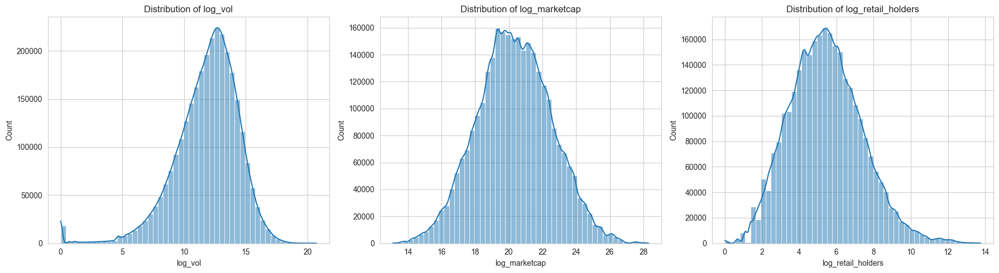

In [ ]:
dl = DataLoader(handle_nans="drop")
dl.merge_dfs()

import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Define features to plot
features = ["vol", "mc", "holders"]
df_desc = dl.df_merged[features+["ticker"]]
# Compute median per ticker
df = df_desc.groupby("ticker").median()

# Apply log transformation
for feature in features:
    df_desc[f"log_{feature}"] = np.log1p(df_desc[feature])

# Set Seaborn style
sns.set_style("whitegrid")

# Create a single row of 3 histograms
fig, axes = plt.subplots(1, 3, figsize=(18, 5))  # 1 row, 3 columns

for i, feature in enumerate(features):
    sns.histplot(df_desc[f"log_{feature}"], bins=50, kde=True, ax=axes[i])
    axes[i].set_title(f"Distribution of log_{feature}")

# Adjust layout
plt.tight_layout()
plt.show()


## Market Data

### Merged Dataframe with CRSP Data

In [3]:
from DataLoader import DataLoader

dl = DataLoader(handle_nans="drop")

dl.df_rh

dl.merge_dfs()
dl.df_merged

Loading Robinhood data
Loading CRSP data


d:\Uni\Bocconi\Thesis\Robinhood_data\DataLoader.py:67: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df_crsp = pd.read_csv(self.df_crsp_path, index_col=[0], parse_dates=[1])


Merging...


,date,ticker,retail_holders,users,retail_holders_adj,permno,shrcd,prc,vol,shrout,cfacpr,cfacshr,sprtrn,prc_adj,shrout_adj,marketcap,marketcap_retail,daily_change_holders,daily_holders
0,2018-05-02,A,590.000000,3.336986,176.806240,87432,11.0,65.91,2240482.0,322477.0,1.0,1.0,-0.007206,65.91,322477000.0,2.125446e+10,38886.900000,NaN,5.239962e+06
1,2018-05-03,A,586.473684,3.347945,175.174218,87432,11.0,66.34,2365851.0,322477.0,1.0,1.0,-0.002254,66.34,322477000.0,2.139312e+10,38906.664211,-3.526316,5.248722e+06
2,2018-05-04,A,587.458333,3.358904,174.895833,87432,11.0,67.00,1331017.0,322477.0,1.0,1.0,0.012811,67.00,322477000.0,2.160596e+10,39359.708333,0.984649,5.246256e+06
3,2018-05-07,A,585.900000,3.391781,172.741115,87432,11.0,67.39,1468735.0,322477.0,1.0,1.0,0.003458,67.39,322477000.0,2.173173e+10,39483.801000,-1.558333,5.236044e+06
4,2018-05-08,A,577.125000,3.402740,169.605978,87432,11.0,67.37,1916103.0,322477.0,1.0,1.0,-0.000266,67.37,322477000.0,2.172528e+10,38880.911250,-8.775000,5.242656e+06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2914450,2020-08-07,ZYNE,32151.291667,11.502732,2795.100416,15646,11.0,4.22,542213.0,29255.0,1.0,1.0,0.000633,4.22,29255000.0,1.234561e+08,135678.450833,-78.916667,3.259810e+07
2914451,2020-08-10,ZYNE,32060.833333,11.523224,2782.279787,15646,11.0,4.24,584599.0,29255.0,1.0,1.0,0.002742,4.24,29255000.0,1.240412e+08,135937.933333,-90.458333,3.266178e+07
2914452,2020-08-11,ZYNE,31939.875000,11.530055,2770.140818,15646,11.0,4.07,449620.0,29255.0,1.0,1.0,-0.007969,4.07,29255000.0,1.190679e+08,129995.291250,-120.958333,3.269811e+07
2914453,2020-08-12,ZYNE,31851.578947,11.536885,2760.847340,15646,11.0,3.96,980844.0,29255.0,1.0,1.0,0.013997,3.96,29255000.0,1.158498e+08,126132.252632,-88.296053,3.268230e+07


In [119]:
dl.df_merged["ticker"].unique()

array(['A', 'AACG', 'AAL', ..., 'ZUMZ', 'ZUO', 'ZYNE'],
      shape=(5221,), dtype=object)

In [120]:
dl.df_crsp["ticker"].unique()

array(['JJSF', 'PLXS', 'RMCF', ..., 'CBOE', 'SANW', 'TSLA'],
      shape=(5221,), dtype=object)

### Open Positions

In [ ]:
df_daily = dl.df_merged[["date", "holders"]]
df_daily = df_daily.groupby("date").sum()
df_daily

,retail_holders
date,
2018-05-02,5.239962e+06
2018-05-03,5.248722e+06
2018-05-04,5.246256e+06
2018-05-07,5.236044e+06
2018-05-08,5.242656e+06
...,...
2020-08-07,3.259810e+07
2020-08-10,3.266178e+07
2020-08-11,3.269811e+07


In [122]:
df_plot = dl.df_rh.loc[df_daily.index]


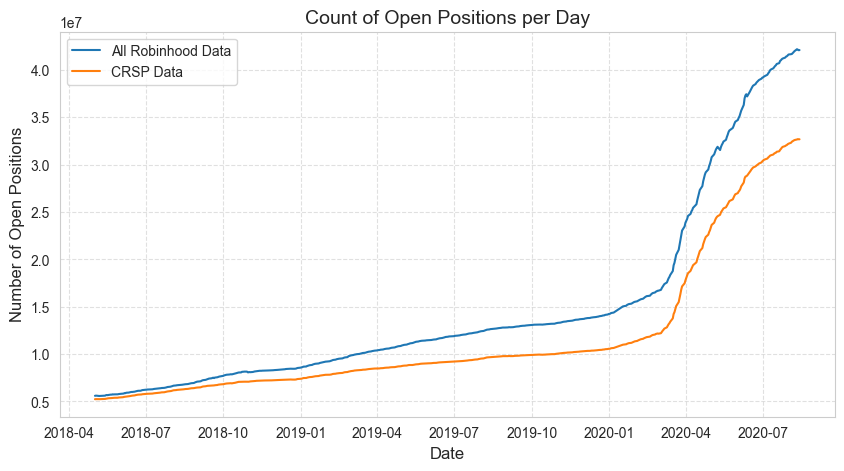

In [ ]:
sns.set_style("whitegrid")

plt.figure(figsize=(10, 5))  # Set figure size
sns.lineplot(x=df_plot.index, y='sum', data=df_plot, label="All Robinhood Data")
sns.lineplot(x=df_plot.index, y='holders', data=df_daily, label="CRSP Data")

# Formatting
plt.xlabel('Date', fontsize=12)
plt.ylabel('Number of Open Positions', fontsize=12)
plt.title('Count of Open Positions per Day', fontsize=14)
plt.xticks(rotation=0)  # Rotate x-axis labels for better readability
plt.grid(True, linestyle='--', alpha=0.6)  # Add grid
plt.legend()

# Show the plot
plt.show()

#### Securities by Number

In [ ]:
mapping = {
    11.0:"Stocks",
    12.0:"Stocks",
    73.0:"ETFs",
    31.0:"Funds",
    44.0:"Funds",
    48.0:"REITs"
}

In [174]:
shrcd_counts =dl.df_merged["shrcd"].value_counts().sort_index()
shrcd_counts = pd.DataFrame(shrcd_counts)
shrcd_counts["classification"] = shrcd_counts.index.map(mapping).fillna("Other")

shrcd_counts = shrcd_counts.groupby("classification").sum() 
shrcd_counts /= shrcd_counts.sum()

shrcd_counts

,count
classification,
ETFs,0.236835
Funds,0.086496
Other,0.091982
REITs,0.005612
Stocks,0.579075


#### Securities by Market Cap

In [ ]:
df_shrcd = dl.df_merged[["shrcd", "mc", "mc_retail"]]
df_shrcd.loc[:,"classification"] = df_shrcd["shrcd"].map(mapping)
df_shrcd["classification"] = df_shrcd["classification"].fillna("Other")
df_shrcd = df_shrcd[["mc_retail","mc","classification"]]
df_shrcd = df_shrcd.groupby("classification").sum()
df_shrcd = df_shrcd / df_shrcd.sum(axis=0) 
df_shrcd = df_shrcd.reset_index()

df_shrcd

,classification,marketcap_retail,marketcap
0,ETFs,0.058236,0.096453
1,Funds,0.035664,0.031237
2,Other,0.013392,0.039540
3,REITs,0.000520,0.003368
4,Stocks,0.892188,0.829402


### Retail Participation vs Market Cap

In [8]:
dl.df_merged

,date,ticker,retail_holders,users,retail_holders_adj,permno,shrcd,prc,vol,shrout,cfacpr,cfacshr,sprtrn,prc_adj,shrout_adj,marketcap,marketcap_retail,daily_change_holders,daily_holders
0,2018-05-02,A,590.000000,3.336986,176.806240,87432,11.0,65.91,2240482.0,322477.0,1.0,1.0,-0.007206,65.91,322477000.0,2.125446e+10,38886.900000,NaN,5.239962e+06
1,2018-05-03,A,586.473684,3.347945,175.174218,87432,11.0,66.34,2365851.0,322477.0,1.0,1.0,-0.002254,66.34,322477000.0,2.139312e+10,38906.664211,-3.526316,5.248722e+06
2,2018-05-04,A,587.458333,3.358904,174.895833,87432,11.0,67.00,1331017.0,322477.0,1.0,1.0,0.012811,67.00,322477000.0,2.160596e+10,39359.708333,0.984649,5.246256e+06
3,2018-05-07,A,585.900000,3.391781,172.741115,87432,11.0,67.39,1468735.0,322477.0,1.0,1.0,0.003458,67.39,322477000.0,2.173173e+10,39483.801000,-1.558333,5.236044e+06
4,2018-05-08,A,577.125000,3.402740,169.605978,87432,11.0,67.37,1916103.0,322477.0,1.0,1.0,-0.000266,67.37,322477000.0,2.172528e+10,38880.911250,-8.775000,5.242656e+06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2914450,2020-08-07,ZYNE,32151.291667,11.502732,2795.100416,15646,11.0,4.22,542213.0,29255.0,1.0,1.0,0.000633,4.22,29255000.0,1.234561e+08,135678.450833,-78.916667,3.259810e+07
2914451,2020-08-10,ZYNE,32060.833333,11.523224,2782.279787,15646,11.0,4.24,584599.0,29255.0,1.0,1.0,0.002742,4.24,29255000.0,1.240412e+08,135937.933333,-90.458333,3.266178e+07
2914452,2020-08-11,ZYNE,31939.875000,11.530055,2770.140818,15646,11.0,4.07,449620.0,29255.0,1.0,1.0,-0.007969,4.07,29255000.0,1.190679e+08,129995.291250,-120.958333,3.269811e+07
2914453,2020-08-12,ZYNE,31851.578947,11.536885,2760.847340,15646,11.0,3.96,980844.0,29255.0,1.0,1.0,0.013997,3.96,29255000.0,1.158498e+08,126132.252632,-88.296053,3.268230e+07


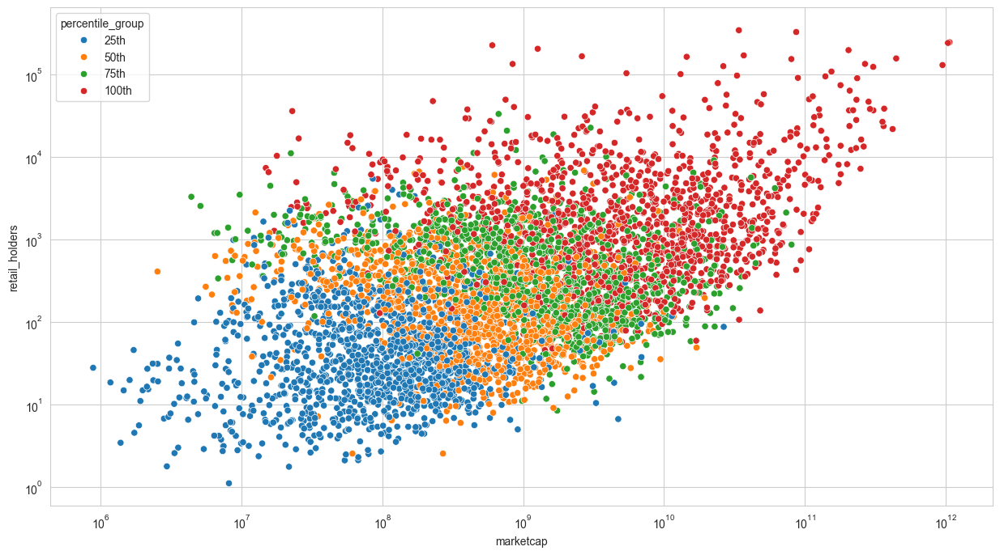

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
sns.set_style("whitegrid")

df_scatter = dl.df_merged[["mc", "holders", "ticker", "vol"]].groupby("ticker").mean()
percentile_bins = [0, 0.25, 0.50, 0.75, 1.0]  
percentile_labels = ["25th", "50th", "75th", "100th"]

df_scatter["percentile_group"] = pd.qcut(df_scatter["vol"], q=percentile_bins, labels=percentile_labels)


plt.figure(figsize=(15,8))

sns.scatterplot(data=df_scatter, x="mc", y="holders", hue="percentile_group")
plt.xscale("log")
plt.yscale("log")
plt.xticks(None)
plt.show()

## Comparing the Portfolios

### Distance Measures


In [2]:
from DataLoader import DataLoader
import warnings
warnings.simplefilter(action='ignore')


dl = DataLoader(handle_nans="drop")


Loading Robinhood data
Loading CRSP data


In [21]:
df_top_n, df_rank = dl.compute_distances(n=100)


Merging...


In [22]:
df_top_n

,date,ticker,marketcap,marketcap_retail,retail_holders,prc_adj,shrcd,rank_mkt,rank_ret,rank_distance,marketcap_daily,marketcap_retail_daily,marketcap_daily_pct,marketcap_retail_daily_pct,pct_distance
0,2018-05-02,AMZN,7.616511e+11,1.137877e+08,72491.0,1569.68005,11.0,2.0,1.0,1.000000,3.275213e+13,5.006985e+08,0.023255,0.227258,4.636125e-02
1,2018-05-02,GOOGL,3.064360e+11,2.806452e+07,27352.0,1026.05005,11.0,9.0,2.0,3.500000,3.275213e+13,5.006985e+08,0.009356,0.056051,2.617262e-03
2,2018-05-02,AAPL,8.678660e+11,2.662411e+07,150785.0,176.57001,11.0,1.0,3.0,-0.666667,3.275213e+13,5.006985e+08,0.026498,0.053174,1.418464e-03
3,2018-05-02,NFLX,1.362154e+11,2.450224e+07,78192.0,313.35999,11.0,36.0,4.0,8.000000,3.275213e+13,5.006985e+08,0.004159,0.048936,2.191220e-03
4,2018-05-02,TSLA,5.113346e+10,2.440459e+07,81038.0,301.14999,11.0,123.0,5.0,23.600000,3.275213e+13,5.006985e+08,0.001561,0.048741,2.299598e-03
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
56395,2020-08-13,BLK,8.988432e+10,3.338501e+06,5662.7,589.56000,11.0,74.0,96.0,-0.229167,4.091712e+13,4.689189e+09,0.002197,0.000712,-1.057103e-06
56396,2020-08-13,ASML,2.860768e+10,3.325958e+06,8874.9,374.76001,12.0,258.0,97.0,1.659794,4.091712e+13,4.689189e+09,0.000699,0.000709,7.178231e-09
56397,2020-08-13,IBM,1.113491e+11,3.221898e+06,25769.0,125.03000,11.0,63.0,98.0,-0.357143,4.091712e+13,4.689189e+09,0.002721,0.000687,-1.397709e-06
56398,2020-08-13,VZ,2.421589e+11,3.219220e+06,55010.6,58.52000,11.0,18.0,99.0,-0.818182,4.091712e+13,4.689189e+09,0.005918,0.000687,-3.591706e-06


In [ ]:
df_rank

In [9]:
df_grouped = df_rank[["date", "rank_distance", "pct_distance"]].groupby("date").sum()


In [ ]:
df_grouped

,rank_distance,pct_distance,test
date,,,
2018-05-02,1811.819864,0.058406,0.0
2018-05-03,1809.602600,0.058731,0.0
2018-05-04,1803.698770,0.057802,0.0
2018-05-07,1802.089824,0.057629,0.0
2018-05-08,1799.504173,0.056502,0.0
...,...,...,...
2020-08-07,1443.599260,0.108647,0.0
2020-08-10,1449.270155,0.108079,0.0
2020-08-11,1448.309724,0.107513,0.0


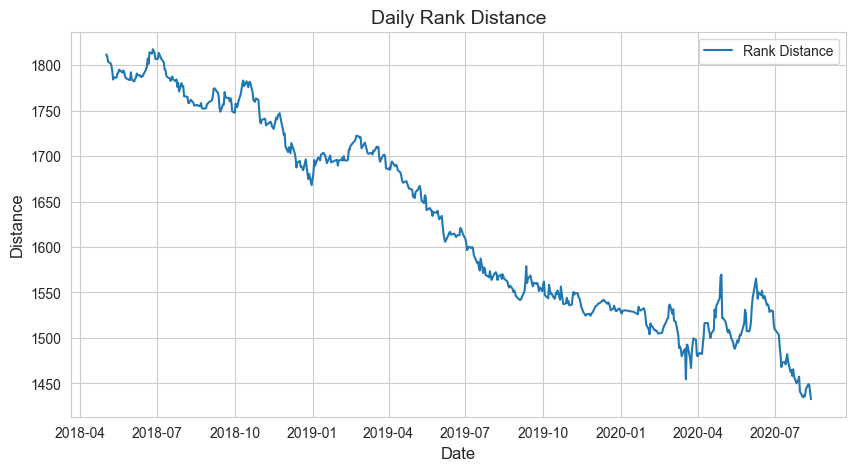

In [10]:
sns.set_style("whitegrid")

plt.figure(figsize=(10, 5))  # Set figure size
sns.lineplot(x=df_grouped.index, y='rank_distance', data=df_grouped, label="Rank Distance")
#sns.lineplot(x=df_grouped.index, y='pct_distance', data=df_grouped, label="Pct Data")

# Formatting
plt.xlabel('Date', fontsize=12)
plt.ylabel('Distance', fontsize=12)
plt.title('Daily Rank Distance', fontsize=14)
plt.xticks(rotation=0)  # Rotate x-axis labels for better readability
plt.legend()

# Show the plot
plt.show()

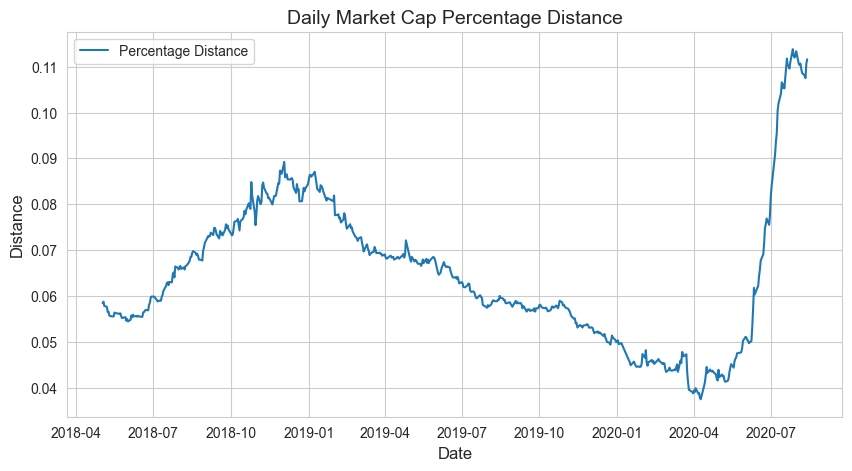

In [ ]:
sns.set_style("whitegrid")

plt.figure(figsize=(10, 5))  # Set figure size
sns.lineplot(x=df_grouped.index, y='pct_distance', data=df_grouped, label="Percentage Distance")

# Formatting
plt.xlabel('Date', fontsize=12)
plt.ylabel('Distance', fontsize=12)
plt.title('Daily Market Cap Percentage Distance', fontsize=14)
plt.xticks(rotation=0)  # Rotate x-axis labels for better readability
plt.legend()

# Show the plot
plt.show()

In [ ]:
df_top_n, df_rank = dl.compute_distances(n=100, by="holders")
df_top_n


,date,ticker,marketcap,marketcap_retail,retail_holders,prc_adj,shrcd,rank_mkt,rank_ret,rank_distance,marketcap_daily,marketcap_retail_daily,marketcap_daily_pct,marketcap_retail_daily_pct,pct_distance
0,2018-05-02,AAPL,8.678660e+11,2.662411e+07,150785.00,176.57001,11.0,1.0,3.0,-0.666667,3.275213e+13,5.006985e+08,0.026498,0.053174,1.418464e-03
1,2018-05-02,GE,1.231322e+11,1.910542e+06,134735.00,14.18000,11.0,40.0,27.0,0.481481,3.275213e+13,5.006985e+08,0.003760,0.003816,2.145829e-07
2,2018-05-02,F,4.387708e+10,1.469306e+06,131071.00,11.21000,11.0,144.0,38.0,2.789474,3.275213e+13,5.006985e+08,0.001340,0.002935,4.680080e-06
3,2018-05-02,AMD,1.063370e+10,1.406486e+06,128212.00,10.97000,11.0,559.0,41.0,12.634146,3.275213e+13,5.006985e+08,0.000325,0.002809,6.978725e-06
4,2018-05-02,GPRO,5.574253e+08,5.671068e+05,114106.00,4.97000,11.0,2813.0,83.0,32.891566,3.275213e+13,5.006985e+08,0.000017,0.001133,1.263577e-06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
56395,2020-08-13,GLUU,1.329236e+09,4.341376e+05,55801.75,7.78000,11.0,1995.0,394.0,4.063452,4.091712e+13,4.689189e+09,0.000032,0.000093,5.563904e-09
56396,2020-08-13,ZOM,7.924917e+07,7.822401e+03,55675.45,0.14050,12.0,4304.0,2767.0,0.555475,4.091712e+13,4.689189e+09,0.000002,0.000002,-4.481460e-13
56397,2020-08-13,ALK,4.672318e+09,2.101058e+06,55598.25,37.79000,11.0,1016.0,148.0,5.864865,4.091712e+13,4.689189e+09,0.000114,0.000448,1.495972e-07
56398,2020-08-13,COTY,3.136320e+09,2.281654e+05,55514.70,4.11000,11.0,1297.0,578.0,1.243945,4.091712e+13,4.689189e+09,0.000077,0.000049,-1.362068e-09


In [19]:
df_rank

,date,ticker,marketcap,marketcap_retail,retail_holders,prc_adj,shrcd,rank_mkt,rank_ret,rank_distance,marketcap_daily,marketcap_retail_daily,marketcap_daily_pct,marketcap_retail_daily_pct,pct_distance
4149,2018-05-02,AAPL,8.678660e+11,2.662411e+07,150785.0,176.57001,11.0,1.0,3.0,-0.666667,3.275213e+13,5.006985e+08,2.649800e-02,5.317393e-02,1.418464e-03
1098468,2018-05-02,GE,1.231322e+11,1.910542e+06,134735.0,14.18000,11.0,40.0,27.0,0.481481,3.275213e+13,5.006985e+08,3.759518e-03,3.815754e-03,2.145829e-07
899912,2018-05-02,F,4.387708e+10,1.469306e+06,131071.0,11.21000,11.0,144.0,38.0,2.789474,3.275213e+13,5.006985e+08,1.339671e-03,2.934512e-03,4.680080e-06
106013,2018-05-02,AMD,1.063370e+10,1.406486e+06,128212.0,10.97000,11.0,559.0,41.0,12.634146,3.275213e+13,5.006985e+08,3.246722e-04,2.809047e-03,6.978725e-06
1157438,2018-05-02,GPRO,5.574253e+08,5.671068e+05,114106.0,4.97000,11.0,2813.0,83.0,32.891566,3.275213e+13,5.006985e+08,1.701951e-05,1.132631e-03,1.263577e-06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
765018,2020-08-13,EFU,2.356688e+06,3.440420e+01,2.0,17.20210,73.0,5158.0,5171.0,-0.002514,4.091712e+13,4.689189e+09,5.759662e-08,7.336920e-09,-3.687514e-16
2208695,2020-08-13,RFEU,2.067975e+07,1.181700e+02,2.0,59.08500,73.0,4885.0,5152.0,-0.051825,4.091712e+13,4.689189e+09,5.054058e-07,2.520052e-08,-1.210142e-14
2671938,2020-08-13,UPV,4.402640e+06,8.805280e+01,2.0,44.02640,73.0,5134.0,5167.0,-0.006387,4.091712e+13,4.689189e+09,1.075990e-07,1.877783e-08,-1.667869e-15
1099595,2020-08-13,GEC,6.765450e+07,0.000000e+00,0.0,2.65000,11.0,4384.0,5172.5,-0.152441,4.091712e+13,4.689189e+09,1.653452e-06,0.000000e+00,-0.000000e+00


### Volatility

In [152]:
df_vol = dl.df_merged[["date", "vol", "daily_change_holders", "daily_holders"]]
df_vol["abs_change"] = df_vol["daily_change_holders"]
df_vol = df_vol[["date", "daily_change_holders", "daily_holders", "vol", "abs_change"]].groupby("date").sum()
df_vol["relative_volatility"] = df_vol["abs_change"] / df_vol["daily_holders"]

In [153]:
dl.df_merged[dl.df_merged["ticker"]=="AMZN"][["daily_change_holders", "vol"]]

,daily_change_holders,vol
121426,NaN,4360073.0
121427,318.210526,4251517.0
121428,-333.210526,3443067.0
121429,-535.300000,3801755.0
121430,-635.700000,3069149.0
...,...,...
121985,1748.000000,3925635.0
121986,3771.041667,3165604.0
121987,2865.583333,3705374.0
121988,1260.589912,3517918.0


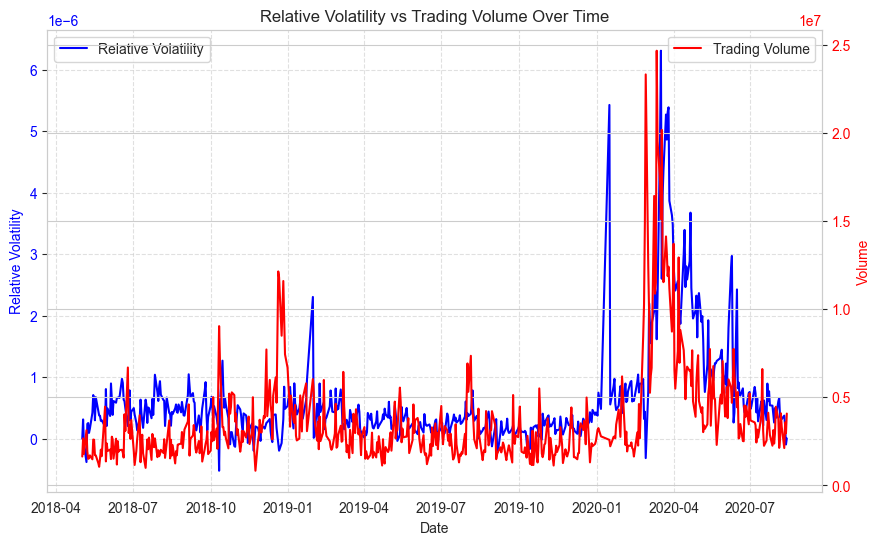

In [154]:
import seaborn as sns
import matplotlib.pyplot as plt

# Create figure and axis
fig, ax1 = plt.subplots(figsize=(10, 6))

# First Y-axis (Left) - Relative Volatility using Seaborn
color1 = "blue"
sns.lineplot(x=df_vol.index, y=df_vol["relative_volatility"], ax=ax1, color=color1, label="Relative Volatility")
ax1.set_xlabel("Date")
ax1.set_ylabel("Relative Volatility", color=color1)
ax1.tick_params(axis="y", labelcolor=color1)

# Second Y-axis (Right) - Volume using Seaborn
df_plot = dl.df_merged[dl.df_merged["ticker"]=="VOO"]
df_plot = df_plot[["vol", "date"]]
ax2 = ax1.twinx()
color2 = "red"
sns.lineplot(x=df_plot["date"], y=df_plot["vol"], ax=ax2, color=color2, label="Trading Volume")
ax2.set_ylabel("Volume", color=color2)
ax2.tick_params(axis="y", labelcolor=color2)

# Title and Grid
plt.title("Relative Volatility vs Trading Volume Over Time")
ax1.grid(True, linestyle="--", alpha=0.6)

# Show plot
plt.show()


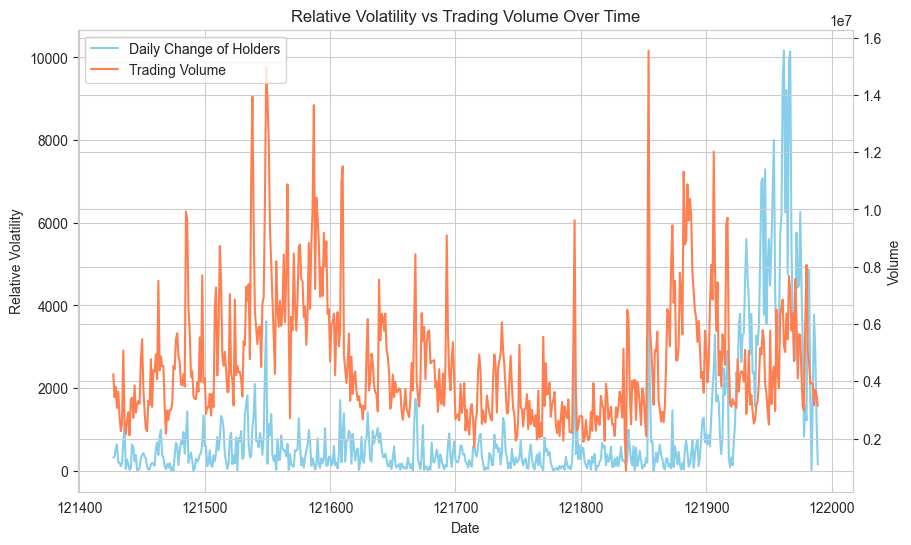

In [157]:
df_amzn = dl.df_merged[dl.df_merged["ticker"]=="AMZN"][["daily_change_holders", "vol"]].dropna()

import seaborn as sns
import matplotlib.pyplot as plt

sns.set_style("whitegrid")

# Create figure and axis
fig, ax1 = plt.subplots(figsize=(10, 6))

# First Y-axis (Left) - Relative Volatility using Seaborn
sns.lineplot(x=df_amzn.index, y=df_amzn["daily_change_holders"].abs(), ax=ax1,  label="Daily Change of Holders", color="skyblue")
ax1.set_xlabel("Date")
ax1.set_ylabel("Relative Volatility")
ax1.tick_params(axis="y")

# Second Y-axis (Right) - Volume using Seaborn
ax2 = ax1.twinx()

sns.lineplot(x=df_amzn.index, y=df_amzn["vol"], ax=ax2, label="Trading Volume", color="coral")
ax2.set_ylabel("Volume")
ax2.tick_params(axis="y")


lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax2.legend(lines1 + lines2, labels1 + labels2, loc="upper left")  # Adjust location as needed


# Title and Grid
plt.title("Relative Volatility vs Trading Volume Over Time")


# Show plot
plt.show()
